In [62]:
%matplotlib inline
import os
os.chdir('/Users/gunnarkleemann/Dropbox/coursework/BerkeleyDataSciences_8_11/BerkeleyCODE/W209code/GenomeWebSite/PrePrc')


In [63]:

import sys, numpy, scipy
import scipy.cluster.hierarchy as hier
import scipy.spatial.distance as dist
import pandas as pd
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np
##http://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.pdist.html
#scipy.spatial.distance.pdist

In [64]:
###from- http://blog.nextgenetics.net/?e=44###
## it is not respecting my line endings anymore
#inFile=open("MatrixGenomDt_Mt.csv", 'r')
#infile2=open("INDIVgenomicDt_Mt.csv", 'r')
#colHeaders=inFile.next()   ## << this is used when the index is on top >>
#inFile.readline()

rowHeaders = []
dataMatrix = []

DtMtx=pd.read_csv("MatrixGenomeDt_Mt_T4.txt")
#DtMtxRECODE=pd.read_csv("MatrixGenomDt_Mt.csv")
DtSample=pd.read_csv("SampleID.csv")

#RECODE the data matrix before the cluster...
#ClinSigDict={0:99,1:8,2:1,3:2,4:-1,5:-2,6:6,7:7,255:0}
#DtMtx=DtMtx.replace(ClinSigDict)

#DataID
#colnames=data.columns
#colnames=colnames.split('/t')
#print colnames
ColNames=DtMtx.iloc[0,:][0].split()
ColNames=ColNames[1:len(ColNames)]


In [65]:
ColNames

['chrMT-8393-T',
 'chrMT-14783-C',
 'chrMT-14800-T',
 'chrMT-14905-A',
 'chrMT-14935-C',
 'chrMT-14950-T',
 'chrMT-14968-C',
 'chrMT-15001-C',
 'chrMT-15049-T',
 'chrMT-15214-C',
 'chrMT-15226-G',
 'chrMT-15287-C',
 'chrMT-15289-C',
 'chrMT-15301-A',
 'chrMT-15323-A',
 'chrMT-15346-A',
 'chrMT-15355-A',
 'chrMT-15385-T',
 'chrMT-15458-C',
 'chrMT-15470-C',
 'chrMT-15553-A',
 'chrMT-15637-T',
 'chrMT-15649-G',
 'chrMT-15682-G',
 'chrMT-15758-G',
 'chrMT-15784-C',
 'chrMT-15927-A',
 'chrMT-12192-A',
 'chrMT-12297-C',
 'chrMT-4295-G',
 'chrMT-8009-A',
 'chrMT-6480-A',
 'chrMT-1095-C',
 'chrMT-1027-G',
 'chrMT-1291-C',
 'chrMT-827-G',
 'chrMT-5843-G',
 'chrMT-5814-C',
 'chrMT-11084-G',
 'chrMT-7444-A',
 'chrMT-9438-A',
 'chrMT-9804-A',
 'chrMT-14831-A',
 'chrMT-15257-A',
 'chrMT-15812-A',
 'chrMT-3394-C',
 'chrMT-4136-G',
 'chrMT-4216-C',
 'chrMT-4917-G',
 'chrMT-10237-C',
 'chrMT-11696-A',
 'chrMT-11253-C',
 'chrMT-12338-C',
 'chrMT-12811-C',
 'chrMT-13637-G',
 'chrMT-13708-A',
 'chrMT-14

In [66]:
# put the data into variables
for n in range(1,len(DtMtx)-1): 
    data=DtMtx.iloc[n,:][0].split() ##
    rowHeaders.append(data[0]) # (this is when indexes are on top Transposed df)
    dataMatrix.append([float(x) for x in data[1:]]) # had to account for index values in array
#for m in range(1,len(DtMtxRECODE)): #DtMtx but not DtMtcRECODE truncates the last item
#    dataRC=DtMtxRECODE.iloc[m,:][0].split()
#    rowHeadersRC.append(dataRC[0]) # (this is when indexes are on top Transposed df)
#    dataMatrixRC.append([float(x) for x in dataRC[1:]]) # had to account for index values in array

#print dataMatrix.shape
#print FROM DATA MATRIX
SamplID=DtSample['Family ID'] ##> this should be sample ID but it was removed <<FIX IT>>
SamplGndr=DtSample['Gender']
PopDesc=DtSample['Population Description']
PopCodeNm=DtSample['PopCode']
PopCode=DtSample['Population']    



In [67]:
#convert native data array into numpy array  
dataMatrix = numpy.array(dataMatrix)
#dataMatrixRC = numpy.array(dataMatrixRC)

print dataMatrix

[[ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 ..., 
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]]


In [68]:
## now we make the distance matrix##
distanceMatrix=dist.pdist(dataMatrix, 'euclidean')

#get the linkage matrix#
#http://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html#
linkageMatrix = hier.linkage(distanceMatrix)

In [69]:
print 'There are ' + str(len(numpy.unique(linkageMatrix))) + ' clusters'

There are 5065 clusters


AttributeError: 'FigureCanvasAgg' object has no attribute 'invalidate'

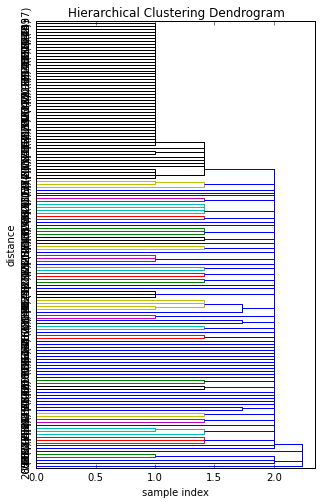

In [79]:
#plot the dendrogram 

plt.figure(figsize=(5, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    linkageMatrix,
    leaf_rotation=90., 
    truncate_mode='lastp',  # show only the last p merged clusters
    p=150,
    orientation='left')
  # show only the last p merged clusters
plt.show()

In [57]:
##REOEDER data to match heat map
#get the order of the dendrogram leaves
heatmapOrder = hier.leaves_list(linkageMatrix)
heatmapOrder.shape
#reorder the data matrix and row headers according to leaves
orderedDataMatrix = dataMatrix[heatmapOrder,:]


    #SamplID=DtSampleRECODE['Sample']

# reorder the population list to match the leaves
rowHeaders = numpy.array(rowHeaders)
#orderedRowHeaders = rowHeaders[heatmapOrder]
#rowHeadersRC = numpy.array(rowHeadersRC)
rowHeaders=list(rowHeaders)
##>> FIX THIS OrderedPopList=rowHeaders2[heatmapOrder,:] # <<<<FIX THIS

rowHeadersOrdr=SamplID[heatmapOrder] # data from the sample file
#OrdSampleInfo=[heatmapOrder,:]
OrdSamplGndr=SamplGndr[heatmapOrder]
OrdPopDesc=PopDesc[heatmapOrder]
OrdPopCodeNm=PopCodeNm[heatmapOrder]
OrdPopCode=PopCode [heatmapOrder]  

In [58]:
str(OrdPopCode)

'2051    YRI\n809     KHV\n768     KHV\n283     CHS\n810     KHV\n943     CDX\n298     CHS\n1828    CHB\n1867    CHB\n1847    CHB\n1864    CHB\n1862    CHB\n1819    CHB\n1790    CHB\n1883    CHB\n1168    GWD\n143     FIN\n2382    TSI\n1927    JPT\n787     KHV\n920     CDX\n986     KHV\n1837    CHB\n1938    JPT\n1593    ITU\n1950    JPT\n294     CHS\n149     FIN\n1719    CEU\n2396    TSI\n       ... \n1350    MSL\n1347    MSL\n1342    ESN\n1340    ESN\n1223    ESN\n1220    ESN\n1233    ESN\n1249    MSL\n1245    ESN\n1242    ESN\n1238    ESN\n1195    MSL\n1211    ESN\n1209    ESN\n1206    ESN\n1202    MSL\n1199    MSL\n1312    MSL\n1310    MSL\n1300    MSL\n1313    MSL\n1264    ESN\n1261    GWD\n1260    GWD\n1291    ESN\n1288    ESN\n1278    ESN\n1787    YRI\n1781    YRI\n2531    GIH\nName: Population, dtype: object'

In [59]:
orderedDataMatrix.min()

-2.0

In [61]:
#output data for visualization in a browser with javascript/d3.js
matrixOutput = []
popmatrixOut = []
row = 0
for rowData in orderedDataMatrix:
    col = 0
    rowOutput = []
    for colData in rowData:
        rowOutput.append([colData, row, col])
        col += 1
    matrixOutput.append(rowOutput)
    row += 1

for rowData in OrdPopCodeNm:
    col = 0
    rowOutput = []
    #for colData in rowData:
    rowOutput.append([colData, row, 0])
       # col += 1
    popmatrixOut.append(rowOutput)
    row += 1
    
    
## FIX> looks like hte min is not -2...<<    
print 'var maxData = ' + str(numpy.amax(orderedDataMatrix)) + ";"
print 'var minData = ' + str(numpy.amin(orderedDataMatrix)) + ";"
print 'var PopDescr = ' + str(list(OrdPopDesc)) + ";"
print 'var Gender = ' + str(list(OrdSamplGndr)) + ";"
print 'var PopCode = ' + str(list(OrdPopCode)) + ";"
print 'var PopCodeNm = ' + str(list(OrdPopCodeNm)) + ";"

print 'var data = ' + str(matrixOutput) + ";"
print 'var cols = ' + str(ColNames) + ";"
print 'var rows = ' + str([x for x in rowHeadersOrdr]) + ";"#orderedRowHeaders]) + ";"#cant get the original method to work
print 'var PopData = ' + str(popmatrixOut) + ";" 





#print 'var popul = ' + str
#matrixOutput

var maxData = 2.0;
var minData = -2.0;
var PopDescr = ['Yoruba in Ibadan, Nigeria', 'Kinh in Ho Chi Minh City, Vietnam', 'Kinh in Ho Chi Minh City, Vietnam', 'Southern Han Chinese, China', 'Kinh in Ho Chi Minh City, Vietnam', 'Chinese Dai in Xishuangbanna, China', 'Southern Han Chinese, China', 'Han Chinese in Bejing, China', 'Han Chinese in Bejing, China', 'Han Chinese in Bejing, China', 'Han Chinese in Bejing, China', 'Han Chinese in Bejing, China', 'Han Chinese in Bejing, China', 'Han Chinese in Bejing, China', 'Han Chinese in Bejing, China', 'Gambian in Western Division, The Gambia', 'Finnish in Finland', 'Toscani in Italy', 'Japanese in Tokyo, Japan', 'Kinh in Ho Chi Minh City, Vietnam', 'Chinese Dai in Xishuangbanna, China', 'Kinh in Ho Chi Minh City, Vietnam', 'Han Chinese in Bejing, China', 'Japanese in Tokyo, Japan', 'Indian Telugu in the UK', 'Japanese in Tokyo, Japan', 'Southern Han Chinese, China', 'Finnish in Finland', 'Utah residents with Northern and Western European anc

var maxData = 99.0;
var minData = 1.0;


In [76]:


n#umpy.savetxt('MatrixTxt_Mt.js', matrixOutput)

TypeError: float argument required, not numpy.ndarray

var maxData = 2.0;
var minData = -2.0;
var data = [[[1.0, 0, 0], [1.0, 0, 1], [1.0, 0, 2], [1.0, 0, 3], [1.0, 0, 4], [1.0, 0, 5], [1.0, 0, 6], [1.0, 0, 7], [1.0, 0, 8], [1.0, 0, 9], [1.0, 0, 10], [1.0, 0, 11], [1.0, 0, 12], [1.0, 0, 13], [1.0, 0, 14], [1.0, 0, 15], [1.0, 0, 16], [1.0, 0, 17], [1.0, 0, 18], [1.0, 0, 19], [1.0, 0, 20], [1.0, 0, 21], [1.0, 0, 22], [1.0, 0, 23], [1.0, 0, 24], [0.0, 0, 25], [1.0, 0, 26], [1.0, 0, 27], [1.0, 0, 28], [0.0, 0, 29], [1.0, 0, 30], [1.0, 0, 31], [1.0, 0, 32], [0.0, 0, 33], [1.0, 0, 34], [1.0, 0, 35], [1.0, 0, 36], [1.0, 0, 37], [1.0, 0, 38], [1.0, 0, 39], [1.0, 0, 40], [1.0, 0, 41], [1.0, 0, 42], [1.0, 0, 43], [1.0, 0, 44], [1.0, 0, 45], [1.0, 0, 46], [1.0, 0, 47], [1.0, 0, 48], [1.0, 0, 49], [1.0, 0, 50], [1.0, 0, 51], [1.0, 0, 52], [1.0, 0, 53], [1.0, 0, 54], [1.0, 0, 55], [1.0, 0, 56], [1.0, 0, 57], [1.0, 0, 58], [1.0, 0, 59], [1.0, 0, 60], [1.0, 0, 61], [1.0, 0, 62], [1.0, 0, 63], [1.0, 0, 64], [1.0, 0, 65], [1.0, 0, 66], [1.0, 0, 67], [1.0, 